In [1]:
import os
import glob
import json
import re
import pandas as pd

In [6]:
def load_gamelog_data(bids_dir):
    """
    Load all JSON gamelog files from a BIDS dataset directory, parse
    subject, session, and repetition info from the filename, and compile
    the data into a pandas DataFrame. Also creates a new column 'full_level'
    which is computed as f'w{world}l{level}' using the 'world' and 'level'
    keys from the JSON data.

    Parameters:
        bids_dir (str): Path to the root of your BIDS dataset.

    Returns:
        pd.DataFrame: DataFrame containing the JSON contents plus metadata
                      and the 'full_level' column.
    """
    # Compile a regex pattern to extract subject, session, and rep from filenames.
    # Example filename: sub-01_ses-001_task-mario_level-w2l1_rep-008.json
    pattern = re.compile(r"sub-(?P<subject>\d+)_ses-(?P<session>\d+).*rep-(?P<rep>\d+)")
    
    # Search for all JSON files in the gamelogs directories.
    json_files = glob.glob(os.path.join(bids_dir, "sub-*", "ses-*", "gamelogs", "*.json"))
    
    records = []
    for json_file in json_files:
        filename = os.path.basename(json_file)
        name_no_ext = os.path.splitext(filename)[0]
        
        # Extract metadata using regex
        match = pattern.search(name_no_ext)
        if match:
            subject = match.group("subject")
            session = match.group("session")
            rep = match.group("rep")
        else:
            subject = session = rep = None
        
        # Load the JSON file content.
        try:
            with open(json_file, 'r') as f:
                data = json.load(f)
        except Exception as e:
            print(f"Error reading {json_file}: {e}")
            continue
        
        # Append the parsed metadata to the JSON data.
        data["subject"] = subject
        data["session"] = session
        data["rep"] = rep
        
        # Create the 'full_level' column using the 'world' and 'level' values, if available.
        if "world" in data and "level" in data:
            data["full_level"] = f'w{data["world"]}l{data["level"]}'
        else:
            data["full_level"] = None
        
        records.append(data)
    
    return pd.DataFrame(records)

bids_path = "/home/hyruuk/GitHub/neuromod/mario_data/mario"
df = load_gamelog_data(bids_path)



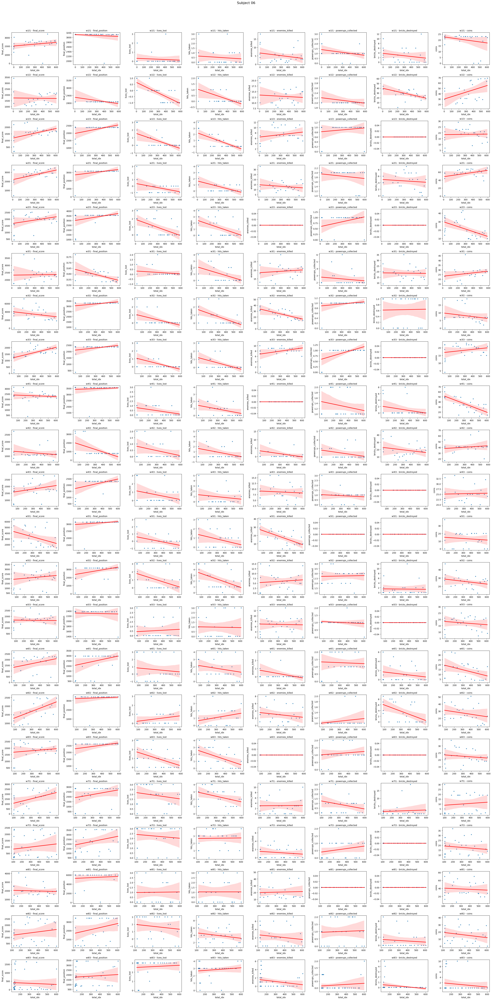

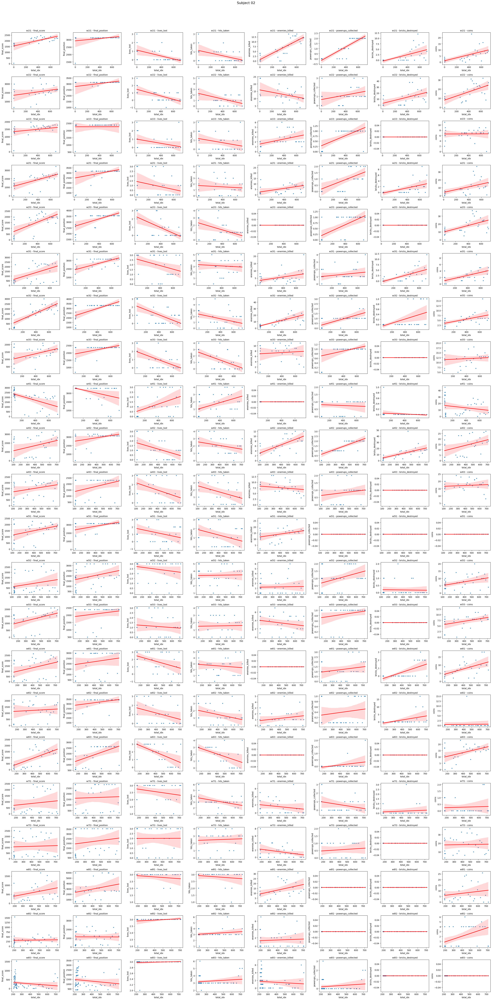

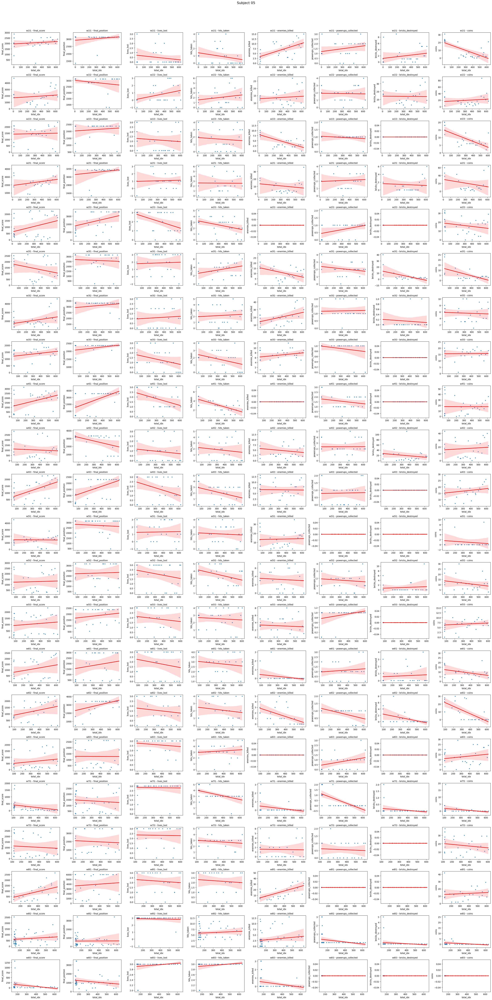

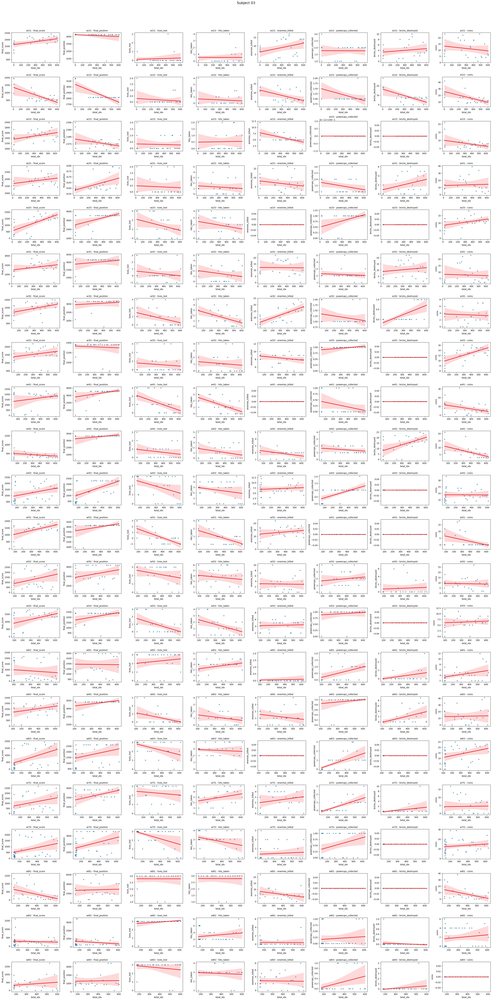

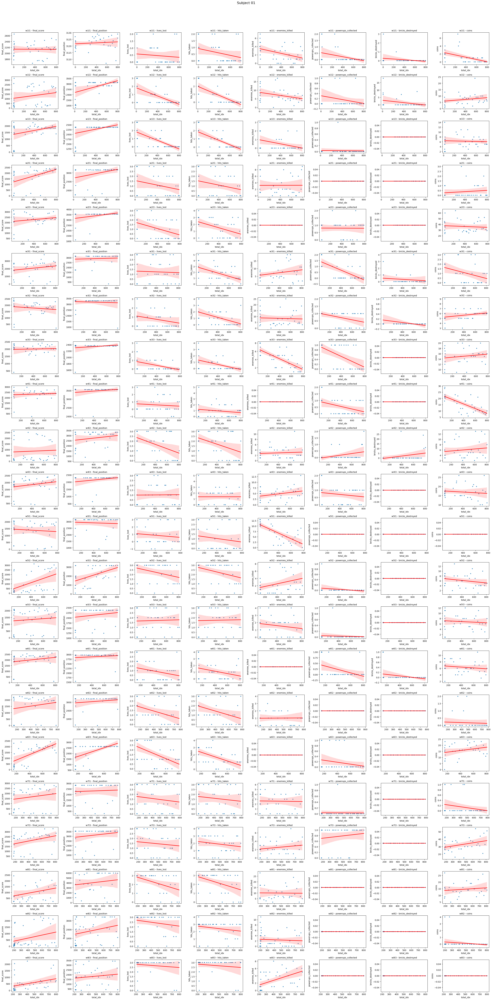

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_subject_data(df):
    """
    For each subject in the DataFrame, create a figure with a grid of regplots.
    Each row corresponds to a unique `full_level` and each column corresponds to one
    of the following variables:
      - final_score
      - final_position
      - lives_lost
      - hits_taken
      - enemies_killed
      - powerups_collected
      - bricks_destroyed
      - coins
    Each subplot is a regplot with `total_idx` on the x-axis.

    Parameters:
        df (pd.DataFrame): DataFrame containing the gamelog data. Must include
                           columns 'subject', 'full_level', 'total_idx', and the
                           eight variables of interest.
    """
    variables = [
        'duration', 'final_score', 'final_position', 'lives_lost', 'hits_taken',
        'enemies_killed', 'powerups_collected', 'coins'
    ]
    
    # Get the unique subjects
    subjects = df['subject'].unique()
    
    for subj in subjects:
        subj_df = df[df['subject'] == subj]
        
        # Get the unique full_level values for the subject and sort them.
        # Assuming full_level is in the format 'w{world}l{level}' (e.g., 'w2l3')
        levels = subj_df['full_level'].dropna().unique()
        def sort_key(full_level):
            try:
                # Remove the leading 'w' and split on 'l'
                world, level = full_level[1:].split('l')
                return (int(world), int(level))
            except Exception:
                return (0, 0)
        levels = sorted(levels, key=sort_key)
        
        nrows = len(levels)
        ncols = len(variables)
        
        # Create a new figure for the subject.
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*3), squeeze=False)
        fig.suptitle(f"Subject {subj}", fontsize=16)
        
        # Loop over each level (row) and each variable (column)
        for i, lvl in enumerate(levels):
            level_df = subj_df[subj_df['full_level'] == lvl]
            for j, var in enumerate(variables):
                ax = axes[i, j]
                # Draw a regplot: x is total_idx, y is the variable of interest.
                sns.regplot(
                    data=level_df, 
                    x='total_idx', 
                    y=var, 
                    ax=ax, 
                    scatter_kws={'s': 10}, 
                    line_kws={'color': 'red'}
                )
                ax.set_title(f"{lvl} - {var}", fontsize=10)
                ax.set_xlabel("total_idx")
                ax.set_ylabel(var)
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

visualize_subject_data(df)

In [9]:
df

,world,level,duration,terminated,cleared,final_score,final_position,lives_lost,hits_taken,enemies_killed,powerups_collected,bricks_destroyed,coins,bk2_idx,run,total_idx,subject,session,rep,full_level
0,7,3,90.583333,True,False,990,2701,3,4,3,1,0,37,5,3,199,06,009,000,w7l3
1,3,3,116.583333,True,True,1320,2357,1,1,9,1,0,23,3,1,186,06,009,000,w3l3
2,6,3,138.783333,True,True,2430,2615,2,3,0,1,0,30,5,4,205,06,009,000,w6l3
3,4,1,134.600000,True,True,2195,3559,0,1,0,2,0,50,5,2,193,06,009,000,w4l1
4,4,2,124.766667,True,True,1080,768,0,0,0,2,12,41,2,3,196,06,009,000,w4l2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3369,6,2,88.250000,True,True,1960,3410,2,2,0,0,0,0,5,2,731,01,019,000,w6l2
3370,6,3,75.850000,True,True,2425,2618,2,2,0,0,0,23,3,1,720,01,019,000,w6l3
3371,8,2,97.850000,True,True,1760,3417,1,1,4,0,0,0,4,1,721,01,019,000,w8l2
3372,6,1,52.200000,True,True,1715,2954,1,1,0,0,0,3,2,1,719,01,019,000,w6l1
